In [1]:
import os
from glob import glob
from torchsummary import summary
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.utils.data as data
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torch.utils.data import Dataset, DataLoader
import cv2
import csv
import xml.etree.ElementTree as ET
import numpy as np
from PIL import Image
import warnings
import dlib
import torchvision.models as models
warnings.filterwarnings(action='ignore')
%load_ext memory_profiler

# Hyperparameter

In [2]:
print('Num_GPU :', torch.cuda.device_count())

no_cuda = False
use_cuda = not no_cuda and torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
Tensor = torch.cuda.FloatTensor if use_cuda else torch.Tensor

params = {
    'batch_size':100 * torch.cuda.device_count(),
    'test_batch_size':100 * torch.cuda.device_count(),
    'input_size':256,
    'resize_scale':280,
    'crop_size':256,
    'fliplr':True,
    'rot':True,
    #model params
    'epoch_count':1,
    'epochs':100,
    'log_interval':2,
    'lr':0.0003,
    'dataroot':'C:/Users/IVCL/Desktop/facial_emotion',
}

Num_GPU : 2


# Utils

In [3]:
def to_np(x):
    return x.data.cpu().numpy()

# Model

In [4]:
%memit

peak memory: 168.43 MiB, increment: 0.29 MiB


In [5]:
# face detection model
%memit detector = dlib.get_frontal_face_detector()

peak memory: 175.44 MiB, increment: 7.00 MiB


In [6]:
# emotion classification model
%memit model = models.mobilenet_v2(pretrained=True)

peak memory: 213.93 MiB, increment: 44.33 MiB


In [7]:
model.classifier[1] = nn.Linear(1280, 5)
model = nn.DataParallel(model).to(device)
summary(model,(3,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             864
       BatchNorm2d-2         [-1, 32, 128, 128]              64
             ReLU6-3         [-1, 32, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]             288
       BatchNorm2d-5         [-1, 32, 128, 128]              64
             ReLU6-6         [-1, 32, 128, 128]               0
            Conv2d-7         [-1, 16, 128, 128]             512
       BatchNorm2d-8         [-1, 16, 128, 128]              32
  InvertedResidual-9         [-1, 16, 128, 128]               0
           Conv2d-10         [-1, 96, 128, 128]           1,536
      BatchNorm2d-11         [-1, 96, 128, 128]             192
            ReLU6-12         [-1, 96, 128, 128]               0
           Conv2d-13           [-1, 96, 64, 64]             864
      BatchNorm2d-14           [-1, 96,

# Preprocess

In [8]:
train_image_paths = glob(params['dataroot'] + '/train/img/*.jpg')
train_emotion_paths = glob(params['dataroot'] + '/train/annotations/*.xml')
test_image_paths = glob(params['dataroot'] + '/test/img/*.jpg')

In [9]:
print(len(train_image_paths),len(test_image_paths), )

1688 184


In [10]:
len(train_emotion_paths)

1688

In [11]:
for img_path, emt_path in zip(train_image_paths,train_emotion_paths):
    img = cv2.imread(img_path)
    
    xl = int(ET.parse(emt_path).getroot()[5][4][0].text)
    yl = int(ET.parse(emt_path).getroot()[5][4][1].text)
    xr = int(ET.parse(emt_path).getroot()[5][4][2].text)
    yr = int(ET.parse(emt_path).getroot()[5][4][3].text)
    
    crop_img = img[yl:yr+1, xl:xr+1] # face를 crop
    cv2.imwrite(img_path[:43]+"face_img"+img_path[46:], crop_img) # face img 저장

In [12]:
train_face_paths = glob(params['dataroot'] + '/train/face_img/*.jpg')[:1300]
val_face_paths = glob(params['dataroot'] + '/train/face_img/*.jpg')[1300:]

In [13]:
print(len(train_face_paths),len(val_face_paths))

1300 388


In [14]:
train_emt_paths = glob(params['dataroot'] + '/train/annotations/*.xml')[:1300]
val_emt_paths = glob(params['dataroot'] + '/train/annotations/*.xml')[1300:]

In [15]:
print(len(train_emt_paths),len(val_emt_paths))

1300 388


In [16]:
class DatasetFromFolder(data.Dataset):
    def __init__(self, image_dir, emotion_dir, transform=None, resize_scale=None, rot=None, crop_size=None,
                 fliplr=False):
        super(DatasetFromFolder, self).__init__()
        self.image_path = image_dir
        self.emotion_path = emotion_dir
        self.transform = transform
        self.resize_scale = resize_scale
        self.rot = rot
        self.crop_size = crop_size
        self.fliplr = fliplr

    def __getitem__(self, index):
        # Load Image
        img_fn = self.image_path[index]
        
        img = cv2.imread(img_fn)
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Load Emotion
        emotion = ET.parse(self.emotion_path[index]).getroot()[5][0].text
        
        if emotion=="neutral": emotion = 0
        elif emotion=="anger": emotion = 1
        elif emotion=="surprise": emotion = 2
        elif emotion=="smile": emotion = 3
        else: emotion = 4
 
        # preprocessing
        if self.resize_scale:
            img = cv2.resize(img, (self.resize_scale, self.resize_scale), cv2.INTER_CUBIC)
                   
        if self.crop_size:
            x = random.randint(0, self.resize_scale - self.crop_size)
            y = random.randint(0, self.resize_scale - self.crop_size)
            img = img[x:x + self.crop_size, y:y + self.crop_size]
        
        if self.rot:
            height, width, channel = img.shape
            temp_img = img
            angle = random.randint(-10, 10)
            matrix = cv2.getRotationMatrix2D((width/2, height/2), angle, 1)
            img = cv2.warpAffine(img, matrix, (width, height))
            for i in range(height):
                for j in range(width):
                    if img[i,j,0]==0 and img[i,j,1]==0 and img[i,j,2]==0:
                        img[i,j]=temp_img[i,j]
        
        if self.fliplr:
            if random.random() < 0.5:
                img = cv2.flip(img, 1)
                      
        if self.transform is not None:
            img = self.transform(img)
        else:
            transform = transforms.ToTensor()
            img = transform(img)
        
        return img, emotion
                                              
    def __len__(self):
        return len(self.image_path)

In [17]:
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])

train_data = DatasetFromFolder(train_face_paths, train_emt_paths, transform=transform,
                               resize_scale=params['resize_scale'], rot=params['rot'], crop_size=params['crop_size'],
                               fliplr=params['fliplr'])
train_data_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=params['batch_size'], shuffle=True)

val_data = DatasetFromFolder(val_face_paths, val_emt_paths, transform=transform,
                             resize_scale=params['input_size'])
val_data_loader = torch.utils.data.DataLoader(dataset=val_data, batch_size=params['test_batch_size'], shuffle=False)

In [18]:
for i, (image, emotion) in enumerate(train_data_loader):
    if i == 0:
        print(image.shape, emotion.shape)
        break

torch.Size([200, 3, 256, 256]) torch.Size([200])


anger


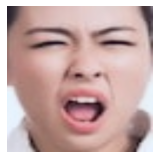

In [19]:
# Get specific val images
val_image, emotion = val_data.__getitem__(10) # Convert to 4d tensor (BxNxHxW)
val_image = val_image.unsqueeze(0)

val_data_image = ((val_image - val_image.min()) / (val_image.max() - val_image.min()))

plt.figure(figsize=(12,12))
plt.subplot(1,4,1)
plt.imshow(val_data_image[0].permute(1,2,0))
plt.axis('off')
emt = ''
if emotion==0: emt = "neutral"
elif emotion==1: emt = "anger"
elif emotion==2: emt = "surprise"
elif emotion==3: emt = "smile"
else: emt = "sad"
print(emt)

# Optimization

In [20]:
# setup optimizer
optimizer = optim.Adam(model.parameters(), lr=params['lr'], weight_decay=3e-5)

# Visualization

In [32]:
def visualization(det_model, emt_model, test_path):
    fig, ax = plt.subplots(1)
    
    emt_model.eval()
    emt_model.to(device)
    transform = transforms.Compose([transforms.ToTensor(),
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])
    
    img = cv2.imread(test_path)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    dets = det_model(img_gray, 1)
    left,right,bottom,top = 0,0,0,0

    if len(dets)>0: # face를 찾는다면
        for det in dets:
            # 음수는 0으로 변경
            if det.left()<0: left=0
            else: left=det.left()
            if det.right()<0: right=0
            else: right=det.right()
            if det.bottom()<0: bottom=0
            else: bottom=det.bottom()
            if det.top()<0: top=0
            else: top=det.top()

            face_img = img[top:bottom, left:right] # face를 crop
            face_img = cv2.resize(face_img, (params['input_size'], params['input_size']), cv2.INTER_CUBIC)
            face_img = transform(face_img).unsqueeze_(0)
            emotion = F.log_softmax(emt_model(face_img)).argmax(dim=1, keepdim=True)

            if emotion==0: emt = "neutral"
            elif emotion==1: emt = "anger"
            elif emotion==2: emt = "surprise"
            elif emotion==3: emt = "smile"
            else: emt = "sad"

            bbox = patches.Rectangle((left,bottom),right-left,top-bottom,linewidth=2,edgecolor="blue", facecolor="none")
            ax.add_patch(bbox)
            plt.text(
                left,
                bottom,
                s=emt,
                color="white",
                verticalalignment="top", 
                bbox={"color": "blue", "pad": 0},
                )
    ax.imshow(img)
    ax.axis("off")

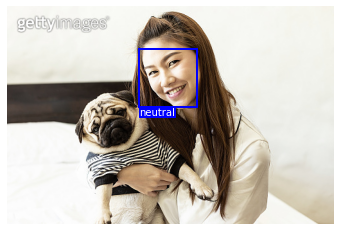

In [22]:
# Training 전 Visualization
visualization(detector, model, test_image_paths[0])

# Training

In [40]:
checkpoint_path = './checkpoints/basic'

In [24]:
train_avg_losses = []
val_avg_losses = []

for epoch in range(params['epoch_count'], params['epochs'] + 1):
    # train
    model.to(device).train()
    
    train_losses = []
    val_losses = []

    for iteration, (batch) in enumerate(train_data_loader):
        
        img, emt = batch[0].to(device), batch[1].to(device)
        pred_emt = F.log_softmax(model(img),dim=1)

        optimizer.zero_grad()
 
        #loss
        loss = F.nll_loss(pred_emt, emt)

        loss.backward()
        optimizer.step()
        
        # loss values
        train_losses.append(loss.item())

        if iteration % params['log_interval'] == 0:
            print("===> Epoch[{}/{}]({}/{}): Loss: {:.4f}".format(
                epoch, params['epochs'],iteration, len(train_data_loader), loss.item()))
        
    # avg loss values for plot
    train_avg_loss = torch.mean(torch.FloatTensor(train_losses)) 
    train_avg_losses.append(train_avg_loss.item())

    model.to(device).eval()
    
    with torch.no_grad():
        for iteration, (batch) in enumerate(val_data_loader):
            
            img, emt = batch[0].to(device), batch[1].to(device)
            pred_emt = F.log_softmax(model(img),dim=1)

            #loss
            loss = F.nll_loss(pred_emt, emt)

            val_losses.append(loss.item())
    
    # avg loss values for plot
    val_avg_loss = torch.mean(torch.FloatTensor(val_losses))
    val_avg_losses.append(val_avg_loss.item())
    
    print("Val_Loss: {:.4f}".format(val_avg_loss.item()))
    
     # Save weight
    if epoch % 1 == 0:
        torch.save(model.state_dict(), checkpoint_path+'/fe-%s.pt'%epoch)

===> Epoch[1/100](0/7): Loss: 1.5924
===> Epoch[1/100](2/7): Loss: 1.2329
===> Epoch[1/100](4/7): Loss: 1.0769
===> Epoch[1/100](6/7): Loss: 0.9281
Val_Loss: 1.8824
===> Epoch[2/100](0/7): Loss: 1.0227
===> Epoch[2/100](2/7): Loss: 0.8959
===> Epoch[2/100](4/7): Loss: 0.6606
===> Epoch[2/100](6/7): Loss: 0.7506
Val_Loss: 1.3831
===> Epoch[3/100](0/7): Loss: 0.7251
===> Epoch[3/100](2/7): Loss: 0.6183
===> Epoch[3/100](4/7): Loss: 0.5752
===> Epoch[3/100](6/7): Loss: 0.5381
Val_Loss: 1.1476
===> Epoch[4/100](0/7): Loss: 0.5780
===> Epoch[4/100](2/7): Loss: 0.4497
===> Epoch[4/100](4/7): Loss: 0.4983
===> Epoch[4/100](6/7): Loss: 0.4900
Val_Loss: 0.8406
===> Epoch[5/100](0/7): Loss: 0.3099
===> Epoch[5/100](2/7): Loss: 0.3801
===> Epoch[5/100](4/7): Loss: 0.3883
===> Epoch[5/100](6/7): Loss: 0.3747
Val_Loss: 0.9479
===> Epoch[6/100](0/7): Loss: 0.2503
===> Epoch[6/100](2/7): Loss: 0.3055
===> Epoch[6/100](4/7): Loss: 0.2551
===> Epoch[6/100](6/7): Loss: 0.2406
Val_Loss: 0.8598
===> Epoch

Val_Loss: 1.8890
===> Epoch[50/100](0/7): Loss: 0.0332
===> Epoch[50/100](2/7): Loss: 0.0545
===> Epoch[50/100](4/7): Loss: 0.0354
===> Epoch[50/100](6/7): Loss: 0.0122
Val_Loss: 2.2031
===> Epoch[51/100](0/7): Loss: 0.0443
===> Epoch[51/100](2/7): Loss: 0.0240
===> Epoch[51/100](4/7): Loss: 0.0188
===> Epoch[51/100](6/7): Loss: 0.0588
Val_Loss: 2.3847
===> Epoch[52/100](0/7): Loss: 0.0069
===> Epoch[52/100](2/7): Loss: 0.0116
===> Epoch[52/100](4/7): Loss: 0.0166
===> Epoch[52/100](6/7): Loss: 0.0263
Val_Loss: 1.8749
===> Epoch[53/100](0/7): Loss: 0.0123
===> Epoch[53/100](2/7): Loss: 0.0359
===> Epoch[53/100](4/7): Loss: 0.0570
===> Epoch[53/100](6/7): Loss: 0.0154
Val_Loss: 1.4199
===> Epoch[54/100](0/7): Loss: 0.0202
===> Epoch[54/100](2/7): Loss: 0.0227
===> Epoch[54/100](4/7): Loss: 0.0181
===> Epoch[54/100](6/7): Loss: 0.0404
Val_Loss: 1.5424
===> Epoch[55/100](0/7): Loss: 0.0245
===> Epoch[55/100](2/7): Loss: 0.0222
===> Epoch[55/100](4/7): Loss: 0.0274
===> Epoch[55/100](6/7):

===> Epoch[98/100](4/7): Loss: 0.0005
===> Epoch[98/100](6/7): Loss: 0.0035
Val_Loss: 2.0573
===> Epoch[99/100](0/7): Loss: 0.0007
===> Epoch[99/100](2/7): Loss: 0.0008
===> Epoch[99/100](4/7): Loss: 0.0005
===> Epoch[99/100](6/7): Loss: 0.0009
Val_Loss: 2.0352
===> Epoch[100/100](0/7): Loss: 0.0004
===> Epoch[100/100](2/7): Loss: 0.0004
===> Epoch[100/100](4/7): Loss: 0.0003
===> Epoch[100/100](6/7): Loss: 0.0081
Val_Loss: 1.9841


In [25]:
# Check overfitting point
print('Epoch :',np.array(val_avg_losses).argmin()+1,'\nLoss :', val_avg_losses[np.array(val_avg_losses).argmin()])

Epoch : 4 
Loss : 0.8405858278274536


# Loss Curve

In [28]:
csvfile=open('./loss/train_loss.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(train_avg_losses).reshape(len(train_avg_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()

csvfile=open('./loss/val_loss.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(val_avg_losses).reshape(len(val_avg_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()

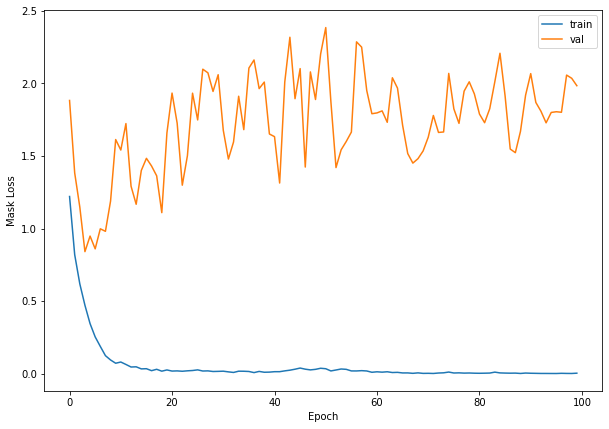

In [26]:
plt.figure(figsize=(10,7))
plt.plot(train_avg_losses, label='train')
plt.plot(val_avg_losses, label='val')
plt.xlabel('Epoch')
plt.ylabel('Mask Loss')
plt.legend()

# Restore Checkpoint

In [41]:
weight_dict = torch.load(checkpoint_path+'/fe-4.pt')

In [42]:
model.load_state_dict(weight_dict)

<All keys matched successfully>

# Test

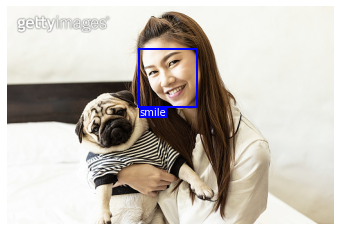

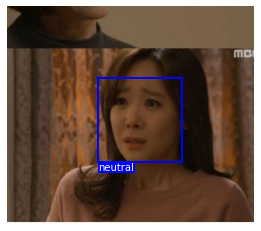

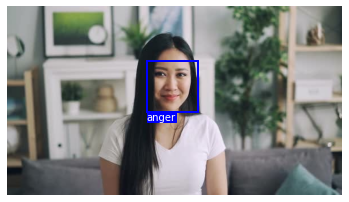

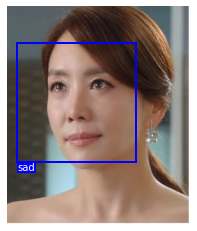

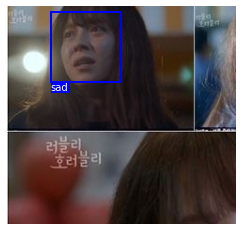

...

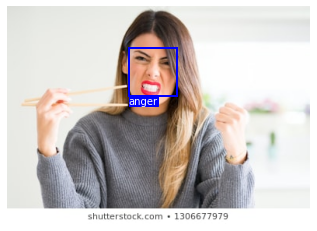

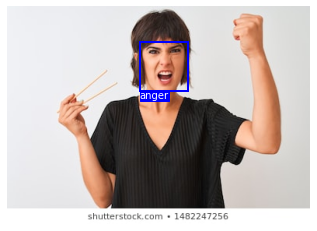

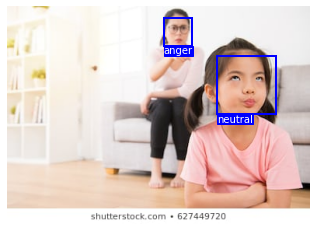

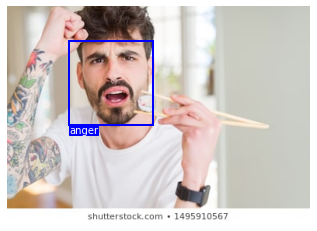

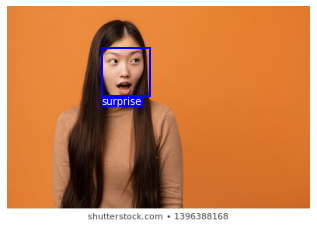

In [33]:
for path in test_image_paths:
    visualization(detector, model, path)